In [2]:
import torch
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
import numpy as np
from tqdm.auto import tqdm
import nrrd
import SimpleITK as sitk
import plotly.express as px
import plotly.subplots as sp
from diffusers import DDPMScheduler, UNet2DModel
from PIL import Image
import SimpleITK as sitk
import json
device = torch.device("cuda")

/mnt/raid/home/ajarry/.conda/envs/difmod/lib/python3.10/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/mnt/raid/home/ajarry/.conda/envs/difmod/lib/python3.10/site-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Pl

In [37]:
def generate_bmap(H, W, t, T, epsilon=0.03):
    gamma = 1.0 - (t / T) * epsilon
    gradient = np.linspace(1.0, gamma, H).reshape(H, 1)
    B_t = np.repeat(gradient, W, axis=1)
    return torch.tensor(B_t, dtype=torch.float32)

class DiffusionModel(pl.LightningModule):
    def __init__(self, lr=1e-5, num_train_timesteps=1000):
        super().__init__()
        self.save_hyperparameters()
        self.net = UNet2DModel(
            in_channels=1,
            out_channels=1,
            layers_per_block=2,
            block_out_channels=(256, 256, 512, 512, 1024, 1024),
            down_block_types=(
                "DownBlock2D",
                "DownBlock2D",
                "DownBlock2D",
                "DownBlock2D",
                "AttnDownBlock2D",
                "DownBlock2D",
            ),
            up_block_types=(
                "UpBlock2D",
                "AttnUpBlock2D",
                "UpBlock2D",
                "UpBlock2D",
                "UpBlock2D",
                "UpBlock2D"
            ),
        )
        self.scheduler = DDPMScheduler(num_train_timesteps=num_train_timesteps, beta_schedule="linear")
        self.loss_fn = nn.MSELoss()

    def forward(self, x, timesteps):
        return self.net(x, timesteps).sample

    def training_step(self, batch, batch_idx):
        x = batch
        B, C, H, W = x.shape
        T = self.scheduler.config.num_train_timesteps
        timesteps = torch.randint(0, T, (B,), device=self.device).long()

        noise = torch.randn_like(x).to(self.device)
        noisy_images = torch.empty_like(x)

        for i in range(B):
            bmap = generate_bmap(H, W, timesteps[i].item(), T).to(x.device)
            bmap = bmap.unsqueeze(0).unsqueeze(0)  # Shape: (1, 1, H, W)
            alpha_t = self.scheduler.alphas_cumprod[timesteps[i]].to(x.device)

            sqrt_alpha_B = torch.sqrt(alpha_t * bmap)
            sqrt_one_minus_alpha_B = torch.sqrt(1.0 - alpha_t * bmap)
            noisy_images[i] = sqrt_alpha_B * x[i] + sqrt_one_minus_alpha_B * noise[i]

        pred = self(noisy_images, timesteps)
        loss = self.loss_fn(pred, noise)

        self.log("train_loss", loss, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x = batch
        B, C, H, W = x.shape
        T = self.scheduler.config.num_train_timesteps
        timesteps = torch.randint(0, T, (B,), device=self.device).long()

        noise = torch.randn_like(x).to(self.device)
        noisy_images = torch.empty_like(x)

        for i in range(B):
            bmap = generate_bmap(H, W, timesteps[i].item(), T).to(x.device)
            bmap = bmap.unsqueeze(0).unsqueeze(0)
            alpha_t = self.scheduler.alphas_cumprod[timesteps[i]].to(x.device)

            sqrt_alpha_B = torch.sqrt(alpha_t * bmap)
            sqrt_one_minus_alpha_B = torch.sqrt(1.0 - alpha_t * bmap)
            noisy_images[i] = sqrt_alpha_B * x[i] + sqrt_one_minus_alpha_B * noise[i]

        pred = self(noisy_images, timesteps)
        loss = self.loss_fn(pred, noise)

        self.log("val_loss", loss, prog_bar=True)
        return loss

    def configure_optimizers(self):
        return optim.Adam(self.net.parameters(), lr=self.hparams.lr)

In [38]:
checkpoint_path = "/mnt/raid/home/ajarry/data/outputs_bmap/output_20250429_100112/model.pth"
model = DiffusionModel()
state_dict = torch.load(checkpoint_path)
model.load_state_dict(state_dict, strict=False)
model = model.to(device)

In [39]:
def generate_bmap(shape, device="cpu"):
    b, c, h, w = shape
    linear_map = torch.linspace(1.0, 0.0, steps=h, device=device).view(1, 1, h, 1)
    bmap = linear_map.expand(b, c, h, w)
    return bmap

# Define the scheduler
scheduler = DDPMScheduler(num_train_timesteps=1000, beta_schedule="linear")

# Set up sampling parameters
image_size = (1, 1, 256, 256)  # (batch, channels, height, width)
num_inference_steps = 500
scheduler.set_timesteps(num_inference_steps)

# Start with pure noise
device = "cuda" if torch.cuda.is_available() else "cpu"
noisy_image = torch.randn(image_size, device=device)
timesteps = scheduler.timesteps.to(device)

# Reverse denoising process using B-maps
with torch.no_grad():
    for i, t in tqdm(enumerate(timesteps), total=len(timesteps)):
        # Predict noise
        noise_pred = model(noisy_image, t.expand(image_size[0]))

        # Standard denoising step
        step_output = scheduler.step(noise_pred, t, noisy_image)
        standard_denoised = step_output.prev_sample

        # Get B-map
        bmap = generate_bmap(noisy_image.shape, device)

        # Apply B-map modulation
        noisy_image = bmap * standard_denoised + (1.0 - bmap) * noisy_image  # guided update


  0%|          | 0/500 [00:00<?, ?it/s]

torch.Size([256, 256, 1])


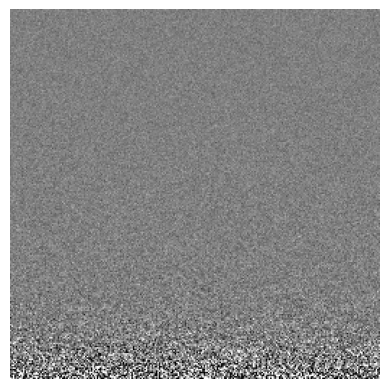

In [40]:
# Convert to image format

generated_image = standard_denoised.cpu().squeeze(0).permute(1,2,0)

print(generated_image.shape)

plt.imshow(generated_image, cmap="gray")
plt.axis("off")
plt.show()

In [6]:
frames = [78,80,82,84,86,90,92,94]
targets = []

data = sitk.GetArrayFromImage(sitk.ReadImage('/mnt/raid/home/ajarry/data/image_capture_output/diffused.nrrd'))
print(data.shape)
fig = px.imshow(data,animation_frame=0, binary_string=True)
fig.show()

# with open ("/mnt/raid/home/ajarry/data/image_capture_output/"+str(frame)+".json","r") as f:
#     dico = json.load(f)
# data = np.rot90(dico['image'],k=3)
# data = np.pad(data, ((40, 0), (0, 0)), mode='constant', constant_values=0)
# data = np.uint8(data[:256,:])
# fig = px.imshow(data, binary_string=True)
# fig.show()
# totensor = transforms.ToTensor()
# target_image = totensor(data.copy()).to(device)
# print(target_image.shape)

(200, 256, 256)


0it [00:00, ?it/s]

torch.Size([1, 1, 256, 256])


0it [00:00, ?it/s]

torch.Size([1, 1, 256, 256])


0it [00:00, ?it/s]

torch.Size([1, 1, 256, 256])


0it [00:00, ?it/s]

torch.Size([1, 1, 256, 256])


0it [00:00, ?it/s]

torch.Size([1, 1, 256, 256])


0it [00:00, ?it/s]

torch.Size([1, 1, 256, 256])


0it [00:00, ?it/s]

torch.Size([1, 1, 256, 256])


0it [00:00, ?it/s]

torch.Size([1, 1, 256, 256])


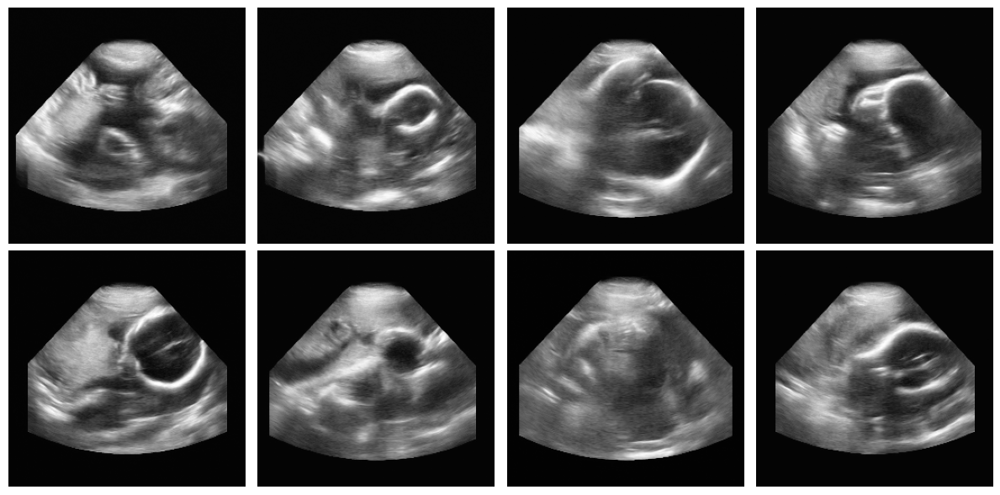

In [44]:
def guidance_loss(image, target):
    return torch.abs(image - target).mean()
guidance_loss_scale = 10
images = []

for target_image in targets:
    x = torch.randn(1, 1, 256, 256).to(device)

    for i, t in tqdm(enumerate(scheduler.timesteps)):

        with torch.no_grad():
            noise_pred = model(x, t)

        # Set x.requires_grad to True
        x = x.detach().requires_grad_()

        # Get the predicted x0
        x0 = scheduler.step(noise_pred, t, x).pred_original_sample

        # Get B-map
        bmap = generate_bmap(x.shape, device)

        # Apply B-map modulation
        x0 = bmap * x0 + (1.0 - bmap) * x0  # guided update

        # Calculate loss
        loss = guidance_loss(x0, target_image) * guidance_loss_scale
        # if i % 10 == 0:
        #     print(i, "loss:", loss.item())

        # Get gradient
        cond_grad = -torch.autograd.grad(loss, x)[0]

        # Modify x based on this gradient
        x = x.detach() + cond_grad

        # Now step with scheduler
        x = scheduler.step(noise_pred, t, x).prev_sample
        
    print(x.shape)
    img = x.detach().squeeze(0).cpu().permute(1,2,0)
    images.append(img)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))  # 2 rows, 4 columns
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i], cmap='gray')  # use cmap='gray' for grayscale images
    ax.axis('off')  # Hide axes for cleaner look

plt.tight_layout()
plt.show()